# [🍩] Lightweight thymus feature analysis using CODEX [CytoKit+SPRM]
By team **shlee** for the HuBMAP Hackathon 20241004
- Soo Hee Lee (https://github.com/sooheelee), indiviudal contributor

### [0.1] Context and data sets

**Problem and Goal**
Thymus Hassall's corpuscles (HCs) are thymic epithelial cells in the medulla region of the human thymus. [H&E staining of HCs show a rosette pattern with few nuclei](https://en.wikipedia.org/wiki/Hassall%27s_corpuscles). Given cytokit cell segmentation relies on nuclei definitions, the few nuclei in HCs from 2D image data produces 'holes' in their spatial representation. The goal of this analysis is to identify HC protein markers and compare HC protein signal inside and outside of defined cells in CODEX thymus samples. The anaysis further compares the CODEX protein detection to that in a 2D IMC (Imaging Mass Cytometry) thymus sample and to a single-cell RNA-Seq thymus atlas dataset. A secondary goal is to show different ways of wrangling genomic image data.

**Background**
HCs are known to produce cytokine TSLP (thymic stromal lymphopoietin), but their function remains an enigma. HCs vary in size with diameters from 20 to more than 100 µm and grow larger with age. They are abesent from mice, except for one strain in New Zealand, making them difficult to study. The number of HCs increases after puberty and then decreases progressively. They contain [keratohyalin](https://en.wikipedia.org/wiki/Keratohyalin). HCs are implicated in diseases such as type 1 diabetes, rheumatoid arthritis, multiple sclerosis, and other autoimmune disease.

**Overall Approach**
Use HuBMAP data portal interactive widgets to explore data and identify a tissue with large structures. Explore data types available for the tissue and study the available samples. Use desktop imaging tools Fiji to estimate size of structure and QuPath to manually create a mask truth set for one of the samples. Parameterize cellpose to segment structures across four CODEX sample images and compare signal from the mask versus cells within the mask. Finally, compare to thymus data sets from 2D Imaging Mass Cytometry (HuBMAP) and CZI single-cell RNA-Seq data (external). Data used in the analysis are as follows.
- [4 HuBMAP CODEX [CytoKit+SPRM] thymus samples](https://portal.hubmapconsortium.org/search?raw_dataset_type_keyword-assay_display_name_keyword[CODEX][0]=CODEX%20%5BCytokit%20%2B%20SPRM%5D&origin_samples.mapped_organ[0]=Thymus&entity_type[0]=Dataset)
- [1 HuBMAP 2D IMC thymus sample](https://portal.hubmapconsortium.org/search?raw_dataset_type_keyword-assay_display_name_keyword[2D%20Imaging%20Mass%20Cytometry][0]=2D%20Imaging%20Mass%20Cytometry&origin_samples.mapped_organ[0]=Thymus&entity_type[0]=Dataset)
- [(external) CZI Science cellxgene human thymus single-cell dataset](https://cellxgene.cziscience.com/collections/de13e3e2-23b6-40ed-a413-e9e12d7d3910)

**Implementation**
- Tools used outside of notebook: QuPath, Fiji
- Python notebook packages: cv2, geopandas, matplotlib, numpy, pandas, scanpy, scipy, seabron, skimage, squidpy, tifffile

**Biological Insights**
Thymus Hassall's corpuscles protein expression is represented by single-cell spatail data. 

In [1]:
# linked datasets
# Select these thymus data sets from the HuBMAP Datasets page and launch a workspace.
# This will autopopulate the workspace with the data sets!
uuids = [
    '43213991a54ce196d406707ffe2e86bd', #HBM373.LDGF.766 CODEX 
    '822c9163d3be9b427dd0830f69a12305', #HBM465.HZHH.676 CODEX
    'd4e9ec618924a8d43cfe1e67c38c1447', #HBM887.SHVF.747 CODEX
    '37d06bb991afa2beb7b9460e746247ad', #HBM893.CCKX.496 CODEX
    '9a6403bb0423e62950926a7d4fdab45b', #HBM256.TVMB.842 2D IMC
]

In [2]:
# CODEX image data urls
ddir = 'datasets/'

# Full resolution, non-pyramidal, multi-page, registered CODEX images, where pixel size == 0.3774µm.
# Registration between channels confirmed quickly by eye, using Fiji.
# 
pixelsize = 0.3774
snames = {'sample1-a': '43213991a54ce196d406707ffe2e86bd', 
          'sample1-b': 'd4e9ec618924a8d43cfe1e67c38c1447', 
          'sample2-a': '822c9163d3be9b427dd0830f69a12305', 
          'sample2-b': '37d06bb991afa2beb7b9460e746247ad',
         }

codexsampleurls = {}

for sn,id in snames.items():
    codexsampleurls[sn] = f'{ddir}{id}/stitched/expressions/reg1_stitched_expressions.ome.tiff'

In [4]:
# CODEX AnnData.zarr urls
codexanndataurls = {}
adatasuffix = '/anndata-zarr/reg1_stitched_expressions-anndata.zarr'

for sn,id in snames.items():
    codexanndataurls[sn] = f'{ddir}{id}{adatasuffix}'

### [0.2] Python packages

In [42]:
#! pip install cellpose
#! pip install squidpy
#! pip install gitpython

In [5]:
import anndata as ad
import ast
import cellpose
import cv2
import geopandas as gpd
import numpy as np
import pandas as pd
import scanpy as sc
import scipy
import seaborn as sns
import skimage as ski
import squidpy as sq
import tifffile
import warnings
import zarr

from cellpose import core, utils, io, models, metrics, plot
from collections import Counter
from git import Repo
from matplotlib import pyplot as plt
from shapely.geometry import Polygon
from tqdm import tqdm

In [4]:
#! pip freeze

absl-py==2.1.0
aiobotocore==2.5.4
aiohappyeyeballs==2.4.0
aiohttp==3.10.5
aioitertools==0.12.0
aiosignal==1.3.1
alabaster==0.7.16
anndata==0.9.1
annotated-types==0.7.0
anyio==4.4.0
anywidget==0.9.10
app-model==0.2.8
appdirs==1.4.4
argon2-cffi==23.1.0
argon2-cffi-bindings==21.2.0
array_api_compat==1.9
arrow==1.3.0
asciitree==0.3.3
asttokens==2.4.1
astunparse==1.6.3
async-lru==2.0.4
async-timeout==4.0.3
attrs==24.2.0
babel==2.16.0
beautifulsoup4==4.12.3
biopython==1.84
bleach==6.1.0
bokeh==3.4.3
botocore==1.31.17
Brotli @ file:///croot/brotli-split_1714483155106/work
build==1.2.2
cachetools==5.5.0
cachey==0.2.1
cellpose==3.0.11
cellxgene-census==1.15.0
certifi==2024.7.4
cffi==1.17.0
charset-normalizer @ file:///croot/charset-normalizer_1721748349566/work
chex==0.1.86
click==8.1.7
cloudpickle==3.0.0
colorcet==3.1.0
comm==0.2.2
contextlib2==21.6.0
contourpy==1.2.1
cycler==0.12.1
Cython @ file:///croot/cython_1712282251484/work
dask==2024.8.0
dask-expr==1.1.10
dask-image==2024.5.3
datashade

In [9]:
# Copy cleaned up files from shlee's github repo
git_url = 'https://github.com/sooheelee/notebooks/'
repo_dir = 'hubmap-hackathon-2024'

# Files of interest are in hubmap-hackathon-2024/shlee-hh-lightweight-thymus/
# This will error if the folder already exists
#Repo.clone_from(git_url, repo_dir)

In [10]:
repofilepath = f'{repo_dir}/{repo_dir}/shlee-hh-lightweight-thymus/'

# [1] Segment structures with cellpose

### [1.1] Segment structures with cellpose: load model, data and truth polygons

In [6]:
# Print progress (cellpose stdout) 
io.logger_setup()

2024-11-12 20:58:44,096 [INFO] WRITING LOG OUTPUT TO /hive/users/sleep/.cellpose/run.log
2024-11-12 20:58:44,097 [INFO] 
cellpose version: 	3.0.11 
platform:       	linux 
python version: 	3.9.19 
torch version:  	2.4.1


(<Logger cellpose.io (INFO)>, PosixPath('/hive/users/sleep/.cellpose/run.log'))

In [7]:
# Cellpose enables use of GPUs; however, not currently for M1 architecture Macs, which I have. 
# Thus, this notebook does not configure for GPU use.
use_GPU = core.use_gpu()
yn = ['NO', 'YES']
print(f'>>> GPU activated? {yn[use_GPU]}')

2024-11-12 20:58:47,753 [INFO] Neither TORCH CUDA nor MPS version not installed/working.
>>> GPU activated? NO


In [8]:
# Use cyto3 cellpose model. 
# Cellpose offers functionality to train custom models, but the pretrained model works well enough for our purposes.
model = models.Cellpose(gpu=False, model_type="cyto3")

2024-11-12 20:58:57,628 [INFO] >>>> using CPU
2024-11-12 20:58:57,629 [INFO] >>>> using CPU
2024-11-12 20:58:57,630 [INFO] >> cyto3 << model set to be used
2024-11-12 20:58:57,715 [INFO] >>>> loading model /hive/users/sleep/.cellpose/models/cyto3


/hive/user-workspaces/sleep/1338/.JupyterLabJobPythonNonGPUCommon_venv/lib/python3.9/site-packages/cellpose/resnet_torch.py:280: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


2024-11-12 20:58:58,012 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


In [51]:
# Created truth set polygons of HC regions manually, in QuPath, for sample1-a. QuPath outputs a geojson. This took ~10 minutes.
codgjurl = f'{repofilepath}sample1-a-3ch.geojson'
cdf = pd.read_json(codgjurl)
codgj = gpd.read_file(codgjurl)
codgj['scalefactor'] = pixelsize
tester = 'sample1-a'

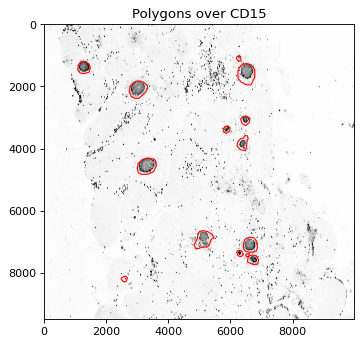

In [10]:
# Visualize truth set polygons
plt.rcParams["figure.figsize"] = (5,5)
plt.rcParams['figure.dpi'] = 80

with tifffile.TiffFile(codexsampleurls[tester]) as ctif:
    cpage = ctif.pages[2]
    cimg = cpage.asarray()
    
    fig,ax = plt.subplots()
    plt.imshow(cimg, cmap='binary', vmax=np.max(cimg)/1)
    codgj.plot(ax=ax, facecolor='none', edgecolor='red', aspect=1)
    plt.title('Polygons over CD15', size=12)
    plt.axis('scaled')
    plt.show()

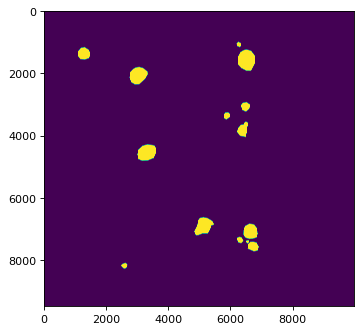

In [11]:
# create a mask of the polygons
mm = np.zeros(cimg.shape)

for i,row in cdf.iterrows():
    p = np.array(row.features['geometry']['coordinates']).squeeze()
    r,c = ski.draw.polygon(p[:,1],p[:,0], cimg.shape)
    mm[r,c] = 1

plt.imshow(mm)

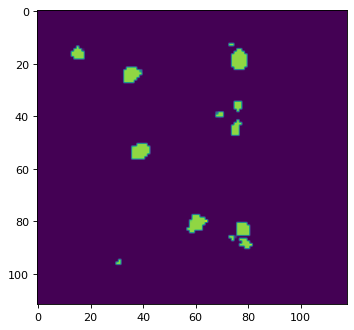

In [17]:
# Create downsampled versions of the mask; factor 0 gives 1 µm pixel size
factors = [0,1,2,3,4,5]
dmasks = {}

for factor in factors:
    dm = scipy.ndimage.zoom(mm,pixelsize/2**factor)
    dmasks[factor] = dm

plt.imshow(dm)

### [1.2] Segment structures with cellpose: parameterize with one sample

In [18]:
# Create subsampled images for use with cellpose; factor 0 gives 1 µm pixel size
factors = [0,1,2,3,4,5]
images = {}

with tifffile.TiffFile(codexsampleurls[tester]) as ctif:
    cpage = ctif.pages[2].asarray()
    print(cpage.shape)

    for factor in factors:
        img = scipy.ndimage.zoom(cpage, pixelsize/2**factor)
        images[factor] = img
        print(factor, img.shape)

(9492, 9973)
0 (3582, 3764)
1 (1791, 1882)
2 (896, 941)
3 (448, 470)
4 (224, 235)
5 (112, 118)


In [19]:
# Cellpose can take single or multipage fluorescent images, e.g. nucleus + cytosolic stains. 
# Using single-image mode.
channels = np.array([[0,0]])

# Cellpose default diameter size is 30 pixels. Test various diameters (given in microns).
diameters = [64, 96, 128, 160, 192]

In [20]:
# Takes ~2 minutes per diameter or <~10 minutes in total
results = {}

for diameter in diameters:
    results[diameter] = {}

    for factor,img in images.items():
        # Rescale micron diameter to match image pixels
        diam = diameter/(2**factor)
        print(factor, diam)

        # Run cellpose
        masks,flows,styles,diams = model.eval(img, diameter=diam, channels=channels)
        results[diameter][factor] = [masks,flows,styles,diams]

0 64.0
2024-11-12 21:55:47,063 [INFO] channels set to [[0 0]]
2024-11-12 21:55:47,064 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 21:56:17,285 [INFO] >>>> TOTAL TIME 30.22 sec
1 32.0
2024-11-12 21:56:17,287 [INFO] channels set to [[0 0]]
2024-11-12 21:56:17,287 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 21:56:30,410 [INFO] >>>> TOTAL TIME 13.12 sec
2 16.0
2024-11-12 21:56:30,411 [INFO] channels set to [[0 0]]
2024-11-12 21:56:30,411 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 21:56:41,833 [INFO] >>>> TOTAL TIME 11.42 sec
3 8.0
2024-11-12 21:56:41,834 [INFO] channels set to [[0 0]]
2024-11-12 21:56:41,835 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 21:56:53,213 [INFO] >>>> TOTAL TIME 11.38 sec
4 4.0
2024-11-12 21:56:53,214 [INFO] channels set to [[0 0]]
2024-11-12 21:56:53,214 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 21:57:04,328 [INFO] >>>> TOTAL TIME 11.11 sec
5 2.0
2024-11-12 21:57:04,329 [INFO] channels set to [[0 0]]
2024-11-12 21:57:04,330 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 21:57:15,299 [INF

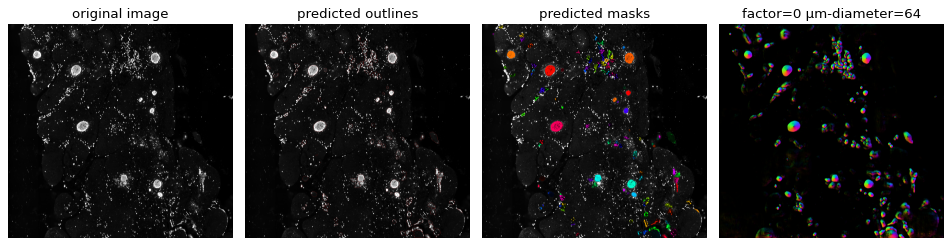

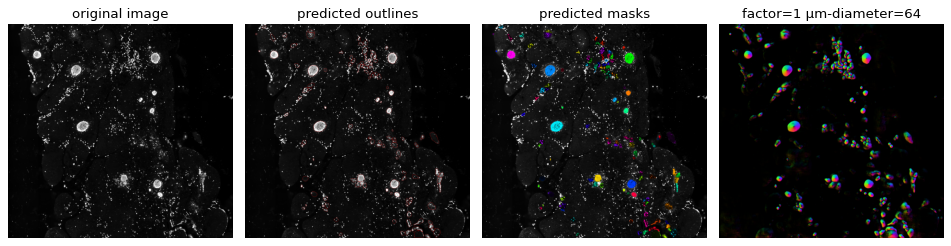

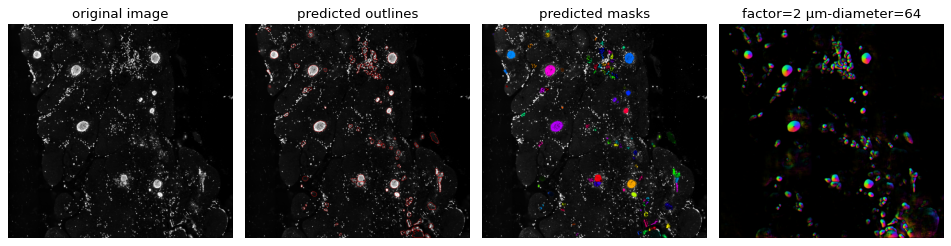

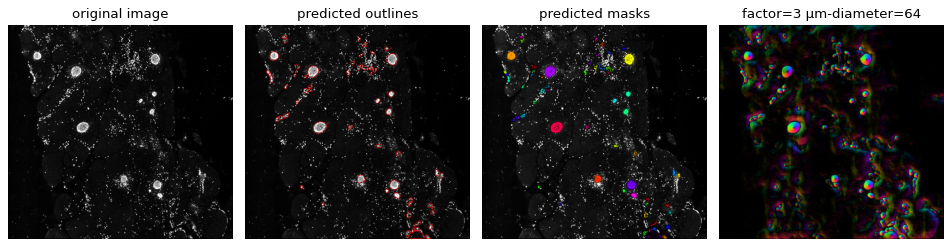

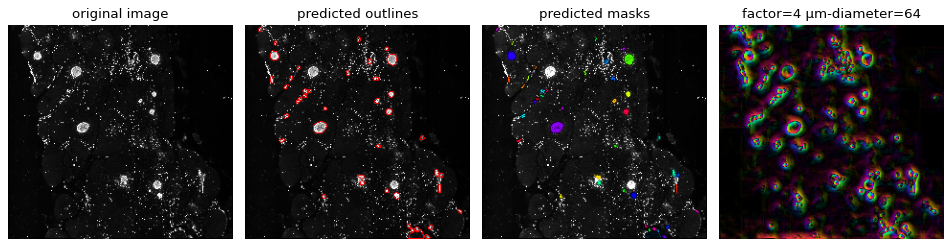

...

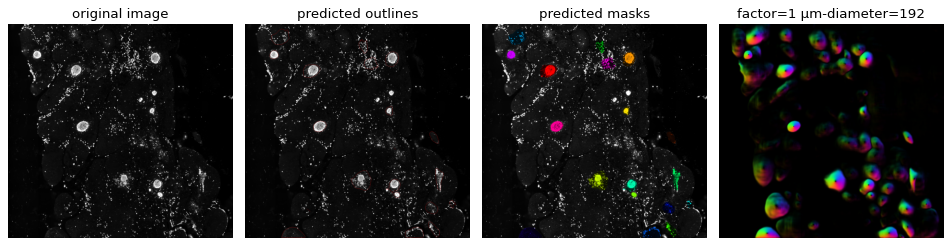

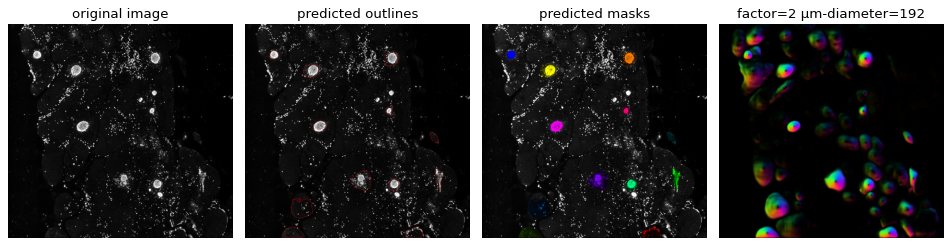

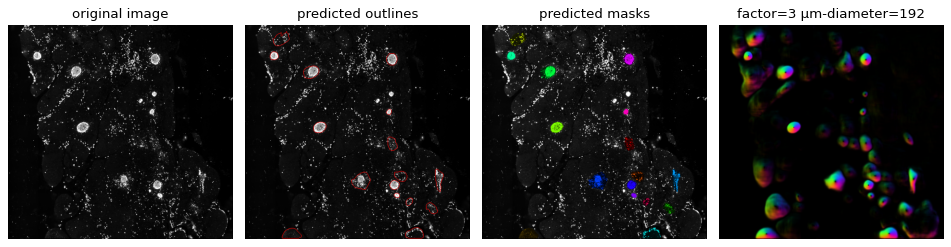

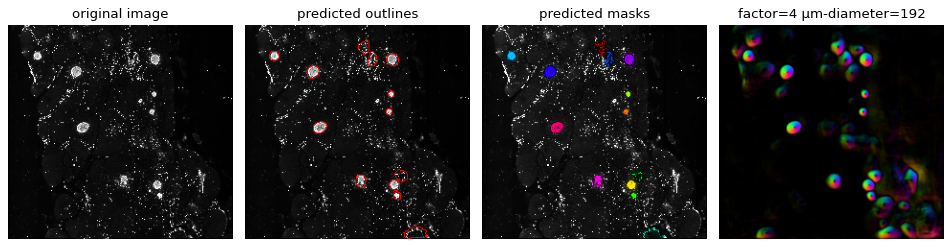

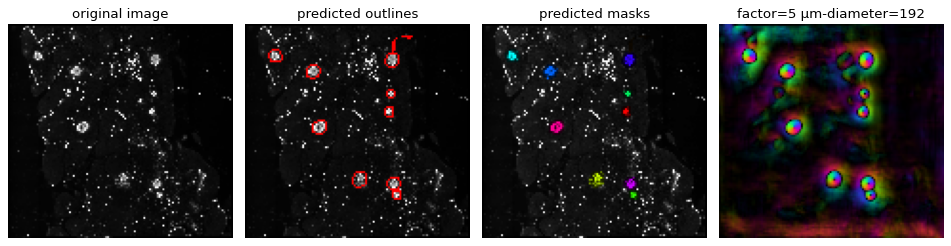

In [21]:
# Plot run results; 4th column lists parameters
for diameter,result in results.items():
    for factor,r in result.items():
        masks,flows,styles,diams = r
        fig = plt.figure(figsize=(12,5))
        plot.show_segmentation(fig, images[factor], masks, flows[0], channels=channels[0])
        plt.tight_layout()
        plt.title(f'factor={factor} µm-diameter={diameter}')
        plt.show()

factor=0 µm-diameter=64 score=0.768 num=128
factor=1 µm-diameter=64 score=0.81 num=120
factor=2 µm-diameter=64 score=0.806 num=99
factor=3 µm-diameter=64 score=0.867 num=59
factor=4 µm-diameter=64 score=0.665 num=42
factor=5 µm-diameter=64 score=0.13 num=2
factor=0 µm-diameter=96 score=0.955 num=77
factor=1 µm-diameter=96 score=0.88 num=60
factor=2 µm-diameter=96 score=0.838 num=57
factor=3 µm-diameter=96 score=0.839 num=41
factor=4 µm-diameter=96 score=1.014 num=13


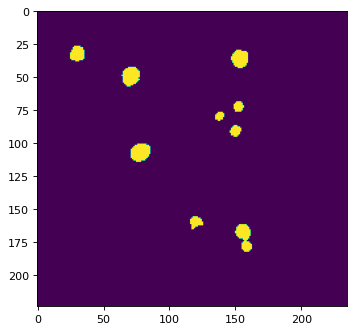

factor=5 µm-diameter=96 score=1.027 num=10


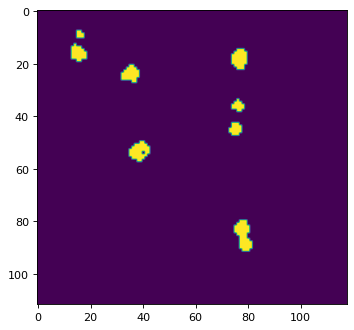

factor=0 µm-diameter=128 score=1.166 num=45
factor=1 µm-diameter=128 score=1.089 num=41
factor=2 µm-diameter=128 score=1.004 num=34
factor=3 µm-diameter=128 score=0.968 num=31
factor=4 µm-diameter=128 score=1.1 num=12
factor=5 µm-diameter=128 score=1.275 num=12
factor=0 µm-diameter=160 score=0.99 num=30
factor=1 µm-diameter=160 score=1.119 num=27
factor=2 µm-diameter=160 score=0.97 num=25
factor=3 µm-diameter=160 score=1.046 num=24
factor=4 µm-diameter=160 score=1.194 num=13
factor=5 µm-diameter=160 score=1.544 num=11
factor=0 µm-diameter=192 score=1.665 num=25
factor=1 µm-diameter=192 score=1.192 num=20
factor=2 µm-diameter=192 score=1.455 num=12
factor=3 µm-diameter=192 score=1.107 num=16
factor=4 µm-diameter=192 score=1.176 num=13
factor=5 µm-diameter=192 score=1.658 num=10


In [22]:
# Fraction overlap with truth set polygons and number of polygons
for diameter,result in results.items():
    for factor,r in result.items():
        masks,flows,styles,diams = r

        truthmask = dmasks[factor]
        intersection_mask = np.logical_and(masks, truthmask)

        # Fraction overlap
        score = round(np.sum(intersection_mask)/np.sum(truthmask),3)

        # Number of polygons
        nummasks = len(Counter(masks.flatten())) - 1

        print(f'factor={factor} µm-diameter={diameter} score={score} num={nummasks}')

        # Plot good segmentations
        if ((score < 1.1) and (score > 0.9) and (nummasks <=16) and (nummasks >=10)):
            plt.imshow(intersection_mask)
            plt.show()

We have a winner: `factor=4 µm-diameter=96 score=1.014, num=13`

In [55]:
# Best parameters and result
factor = 4
diameter = 96
masks,flows,styles,diams = results[diameter][factor]

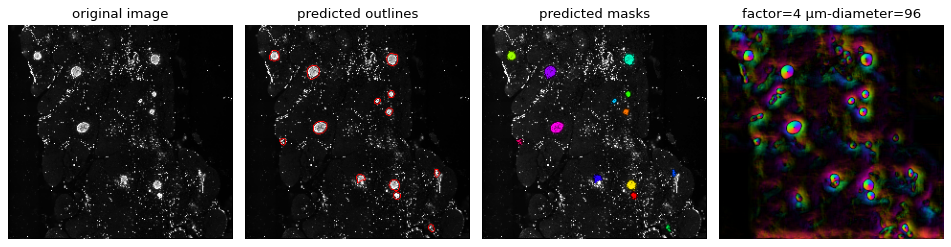

In [24]:
# Visualize winning result
fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, images[factor], masks, flows[0], channels=channels[0])
plt.tight_layout()
plt.title(f'factor={factor} µm-diameter={diameter}')
plt.show()

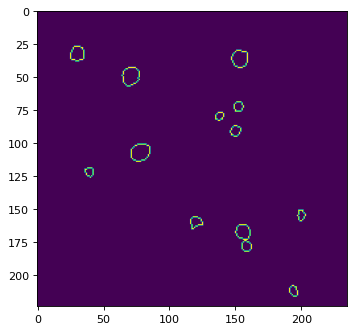

In [25]:
# Visualize the outlines alone
plt.imshow(utils.masks_to_outlines(masks))

### [1.3] Segment structures with cellpose: apply best parameters to all samples

In [56]:
# Extract and downsample CD15 channel image, and save the original image dimensions
diameter = 96
images = {}
originalshapes = {}

for sample,sampleurl in codexsampleurls.items():
    with tifffile.TiffFile(sampleurl) as ctif:
        ct = ctif.pages[2].asarray()
        originalshapes[sample] = ct.shape
        
        img = scipy.ndimage.zoom(ct, pixelsize/2**factor)
        images[sample] = img
        print(sample, ct.shape, img.shape)

sample1-a (9492, 9973) (224, 235)
sample1-b (9486, 9971) (224, 235)
sample2-a (9485, 10000) (224, 236)
sample2-b (9493, 9973) (224, 235)


In [57]:
# Run cellpose on each sample with winning parameters
sresults = {}
diam = diameter/(2**factor)
print(factor,diam)

for sample,img in images.items():
    print(sample)
    masks,flows,styles,diams = model.eval(img, diameter=diam, channels=channels)
    sresults[sample] = [masks,flows,styles,diams]

4 6.0
sample1-a
2024-11-12 23:16:39,779 [INFO] channels set to [[0 0]]
2024-11-12 23:16:39,779 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 23:16:45,478 [INFO] >>>> TOTAL TIME 5.70 sec
sample1-b
2024-11-12 23:16:45,479 [INFO] channels set to [[0 0]]
2024-11-12 23:16:45,480 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 23:16:50,980 [INFO] >>>> TOTAL TIME 5.50 sec
sample2-a
2024-11-12 23:16:50,981 [INFO] channels set to [[0 0]]
2024-11-12 23:16:50,981 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 23:16:56,439 [INFO] >>>> TOTAL TIME 5.46 sec
sample2-b
2024-11-12 23:16:56,440 [INFO] channels set to [[0 0]]
2024-11-12 23:16:56,440 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 23:17:01,934 [INFO] >>>> TOTAL TIME 5.49 sec


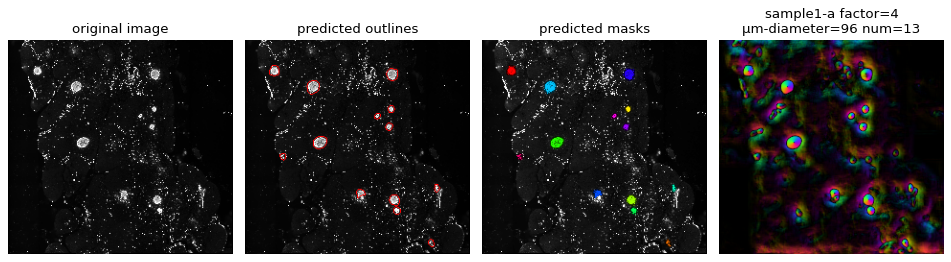

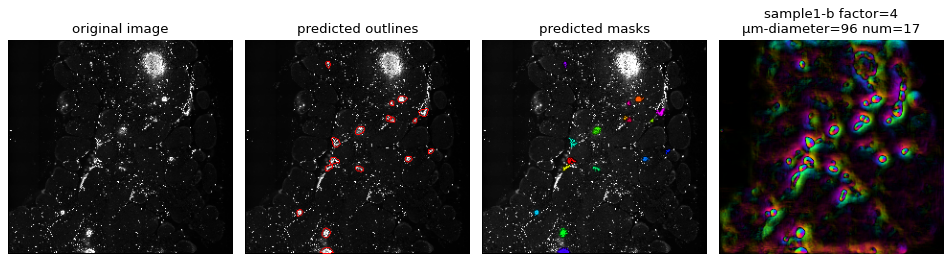

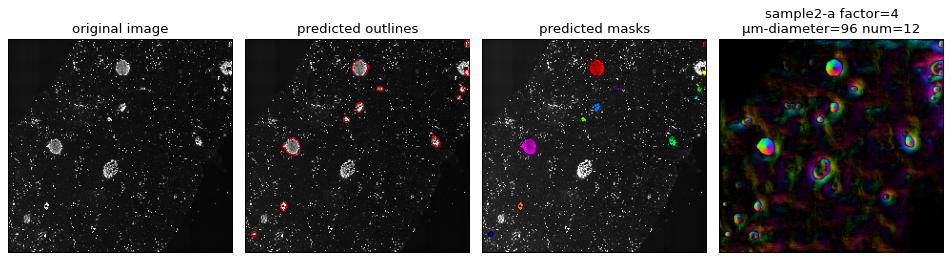

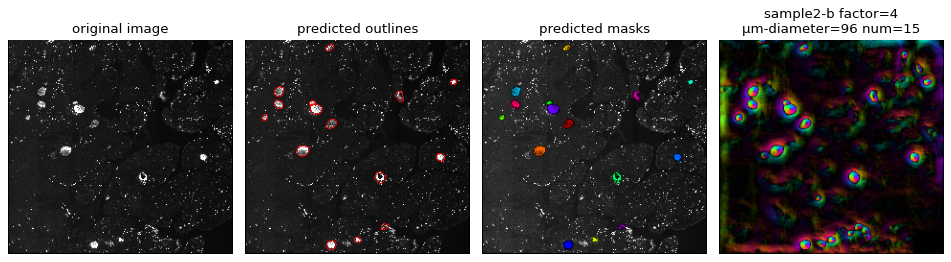

In [58]:
# Plot results for samples
for sample,result in sresults.items():
    masks,flows,styles,diams = result
    #nummasks,_ = cv2.connectedComponents(masks.astype(np.uint8))
    nummasks = len(Counter(masks.flatten())) - 1
    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, images[sample], masks, flows[0], channels=channels[0])
    plt.tight_layout()
    plt.title(f'{sample} factor={factor}\nµm-diameter={diameter} num={nummasks}')
    plt.show()

We got most, but not all. We are missing at least two large ones. 

### [1.4] Segment structures with cellpose: rescue missed features and add to best results

In [59]:
# Rescue larger structures with an increased diameter cellpose run
diameter = diameter*2
print(diameter)

192


In [60]:
sresults2 = {}
diam = diameter/(2**factor)
print(factor,diam)

for sample,img in images.items():
    print(sample)
    masks,flows,styles,diams = model.eval(img, diameter=diam, channels=channels)
    sresults2[sample] = [masks,flows,styles,diams]

4 12.0
sample1-a
2024-11-12 23:17:03,224 [INFO] channels set to [[0 0]]
2024-11-12 23:17:03,224 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 23:17:05,017 [INFO] >>>> TOTAL TIME 1.79 sec
sample1-b
2024-11-12 23:17:05,018 [INFO] channels set to [[0 0]]
2024-11-12 23:17:05,018 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 23:17:06,869 [INFO] >>>> TOTAL TIME 1.85 sec
sample2-a
2024-11-12 23:17:06,870 [INFO] channels set to [[0 0]]
2024-11-12 23:17:06,870 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 23:17:08,626 [INFO] >>>> TOTAL TIME 1.76 sec
sample2-b
2024-11-12 23:17:08,627 [INFO] channels set to [[0 0]]
2024-11-12 23:17:08,627 [INFO] ~~~ FINDING MASKS ~~~
2024-11-12 23:17:10,403 [INFO] >>>> TOTAL TIME 1.78 sec


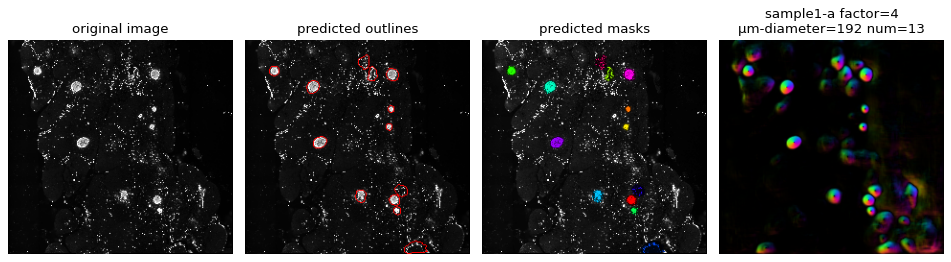

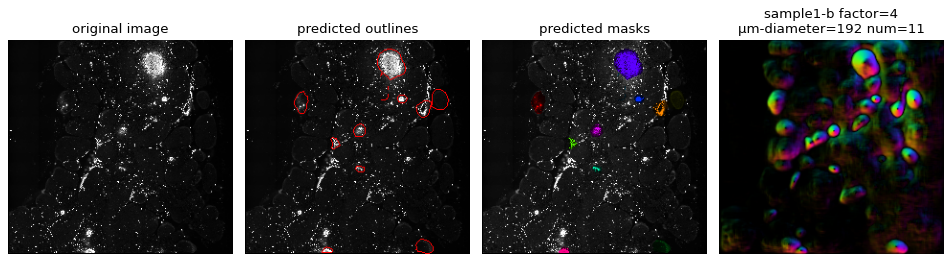

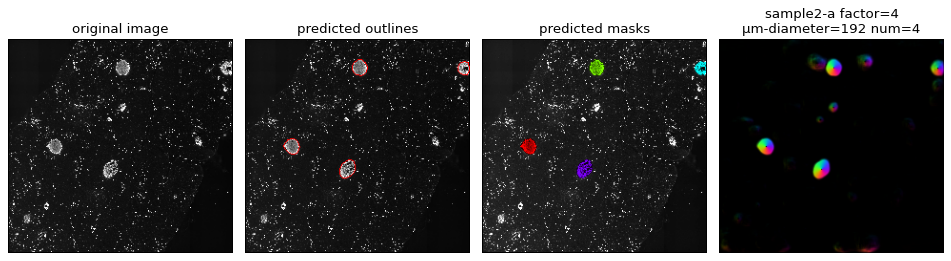

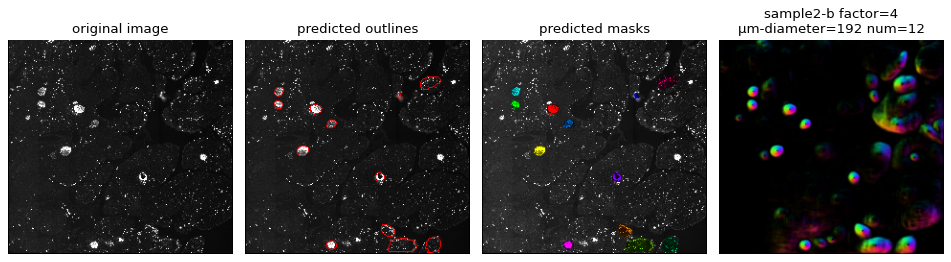

In [61]:
# Plot results for samples
for sample,result in sresults2.items():
    masks,flows,styles,diams = result
    nummasks = len(Counter(masks.flatten())) - 1
    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, images[sample], masks, flows[0], channels=channels[0])
    plt.tight_layout()
    plt.title(f'{sample} factor={factor}\nµm-diameter={diameter} num={nummasks}')
    plt.show()

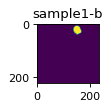

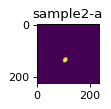

In [62]:
plt.rcParams["figure.figsize"] = (1,1)
plt.rcParams['figure.dpi'] = 80

# For the two samples, subset masks to the missed larger ones
rescuethese = {}

for sample in ['sample1-b', 'sample2-a']:
    mask = sresults2[sample][0]
    contours,_ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    sizecompare = 0
    largest = None
    
    for i,contour in enumerate(contours):
        objectmask = np.zeros_like(mask)
        cv2.drawContours(objectmask, [contour], -1, 255, -1)
        size = len(contour)
        
        # For sample2-a, interestingly cellpose called the size=29 object and missed the size=28 object called with the increased diameter. 
        # So our assumption the largest object is the missed object is erroneous. This requires some custom hacking.
        if (sample == 'sample2-a') and (size ==28):
            size = size*2
            
        if size >= sizecompare:
            sizecompare = size
            largest = objectmask
         
    rescuethese[sample] = largest
    plt.imshow(largest)
    plt.title(sample)
    plt.show()

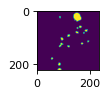

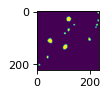

In [63]:
# Merge rescued mask objects to corresponding masks (masks,flows,styles,diams)
updatedmasks = {}

for sample,cellposeresult in sresults.items():
    masks = cellposeresult[0]
    
    if sample in rescuethese.keys():
        addmask = rescuethese[sample]
        masks = np.ma.mask_or(masks, addmask)         
        plt.imshow(masks)
        plt.show()
    else:
        masks = masks.astype(bool)

    updatedmasks[sample] = masks

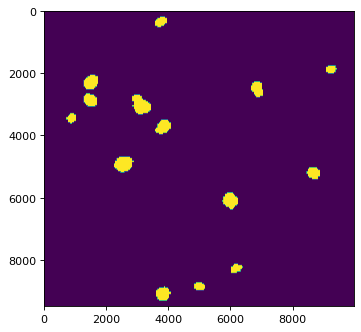

In [130]:
# Transform masks to full-resolution size and save to file
codexsamplemasks = {}

for sample,masks in updatedmasks.items():
    img = ski.transform.resize(masks, originalshapes[sample], order=0)
    img = img.astype(int)
    codexsamplemasks[sample] = img

    # Write masks to files; this updated to write to NPY
    np.save(f'{sample}-factor-diameter-mask.npy', img, allow_pickle=True)

# Visualize one to check rescale
plt.imshow(img)

In [34]:
# Read in saved masks
codexsamplemasks = {}

for sample in snames:
    codexsamplemasks[sample] = np.load(f'{sample}-factor-diameter-mask.npy')

# [2] Apply masks to CODEX

### [2.1] Apply masks to CODEX: images to quantify protein signal in HCs across samples
A more refined analysis would subtract the cytokit cell masks from the HC masks.

In [11]:
# Wrangle CODEX 29 channel metadata labels. I cleaned these up from other metadata.
codexgenemap = pd.read_csv(f'{repofilepath}codexgenemap-shlee.csv', header=None)
codexgenemap.columns = ['codex-raw', 'codex']
codexgenemap[:2]

,codex-raw,codex
0,CD107a,LAMP1
1,CD11c,ITGAX


In [12]:
# Wrangle CODEX 29 channel metadata labels. I cleaned these up from other metadata.
codexgenemap = pd.read_csv(f'{repofilepath}codexgenemap-shlee.csv', header=None)
codexgenemap.columns = ['codex-raw', 'codex']
codexgenemap[:2]

,codex-raw,codex
0,CD107a,LAMP1
1,CD11c,ITGAX


In [135]:
def get_pixel_values_for_mask_components(image, mask):
    num_labels, labels = cv2.connectedComponents(mask.astype(np.uint8))
    cpixelvalues,cpixelsums,cpixelareas,cmeanpixels = [],[],[],[]

    for label in range(1, num_labels):  # Skip label==0==background
        cmask = labels == label
        cpixels = image[cmask]
        cpixelvalues.append(cpixels)

        pixelsum = np.sum(cpixels)
        area = np.sum(cmask)
        cpixelsums.append(pixelsum)
        cpixelareas.append(area)
        cmeanpixels.append(round(pixelsum/area,2))

    return cpixelvalues,cpixelsums,cpixelareas,cmeanpixels

In [35]:
#### Extract protein signal from images corresponding to cellpose masks across samples and channels
cmeanpixels = {}
cpixelareas = {}

for sample,samurl in codexsampleurls.items():
    print(sample)
    mask = codexsamplemasks[sample]

    # Shrink the mask a bit to pertain only to HC internal area; 
    # Visual inspection showed CD15 is mutually exclusive with CD3E, so use CD3E as the marker to exclude
    for i in range(30):
        mask = ski.morphology.binary_erosion(mask)
    
    with tifffile.TiffFile(samurl) as ctif:
        smeanpixels = {}
    
        for pag in tqdm(range(len(ctif.pages)), delay=5):
            cpage = ctif.pages[pag]
            cimg = cpage.asarray()
            _,_,careas,meanpixels = get_pixel_values_for_mask_components(cimg, mask)
            smeanpixels[pag] = meanpixels

            if pag == 2:
                plt.rcParams["figure.figsize"] = (5,5)
                plt.rcParams['figure.dpi'] = 80
                fig,ax = plt.subplots()
                plt.imshow(cimg, cmap='binary', vmax=np.max(cimg)/1)
                plt.imshow(mask, aspect=1, alpha=0.5)
                plt.show()                 

        ctif.close()
        cmeanpixels[sample] = smeanpixels
        cpixelareas[sample] = careas

sample1-a


NameError: name 'get_pixel_values_for_mask_components' is not defined

In [ ]:
# Format mean pixels into dataframes; create unique barcode ids for sample HCs
samplebarcodes = {}
cmpixdf = {}

for sample,array in cmeanpixels.items():        
    df =  pd.DataFrame(array)
    cmpixdf[sample] = df
    numbcs = len(df)
    persamplebcs = []

    for n in range(numbcs):
        nstr = str(n).zfill(3)
    
        bc = f'{sample}-hc-{nstr}'
        persamplebcs.append(bc)

    samplebarcodes[sample] = persamplebcs

cmpixdf[sample][:2]

In [ ]:
# Create single AnnData objects of the data. Brings the data into a familiar data format paradigm of biomedical scientists.
adfs = []

for sample,df in cmpixdf.items():
    adata = ad.AnnData(X=df)
    # Define barcodes
    adata.obs.index = samplebarcodes[sample]
    adata.obs['sample'] = sample
    adata.obs['identification-method'] = 'cellpose CD15+'
    #TODO: Add spatial information for each HC, e.g. centroid positions and the size (area)
    adata.obs['area'] = cpixelareas[sample]

    # Define feature names
    adata.var.index = codexgenemap['codex']
    adata.var['codex-raw'] = codexgenemap['codex-raw']
    adata.var['feature_type'] = 'CODEX Antibody'

    adfs.append(adata)
    print(adata)

# Given unique barcodes across samples, concatenate into single anndata object
cad = ad.concat(adfs)

In [ ]:
# Process as if single-cell RNA-Seq data. 
sc.pp.filter_cells(cad, min_counts=2)
sc.pp.filter_genes(cad, min_cells=2)
cad.layers["raw"] = cad.X.copy()
sc.pp.normalize_total(cad, inplace=True)
sc.pp.log1p(cad)
sc.pp.pca(cad)
sc.pp.neighbors(cad)
sc.tl.umap(cad)
sc.tl.leiden(cad, n_iterations=2)

In [ ]:
g = sns.clustermap(
    cad.to_df().T, 
    standard_scale=1,
    cmap='mako',
    figsize=(15,8),
)
g.fig.suptitle("Protein expression across Hassall's corpuscles in four CODEX samples", size=16)
plt.show()

A subset of HCs show differential expression.

In [ ]:
# Explore gene x gene relationships while factoring for HC size.
sns.scatterplot(
    x = 'CD3E',
    y = 'KRT8|KRT5|KRT34',
    data = cad.to_df().merge(cad.obs.area, how='left', left_index=True, right_index=True),
    hue = 'area',
)
plt.legend(loc=(1.04,0))
plt.xscale('log')
plt.yscale('log')
plt.show()

### [2.2] Apply masks to CODEX: Cytokit segmented cells to identify cell markers and subset HC cells across samples

In [145]:
#warnings.filterwarnings("ignore", category=Warning)

In [146]:
# Process AnnData Zarrs across samples
fulladatas = {}

for sample,url in tqdm(codexanndataurls.items()):
    print(url)

    # This works on my laptop but not in HuBMAP Workspaces even with 'load_remote_anndata_zarr'
    # zarr.open(url + "/X") works but is inconvenient
    #adata = ad.read_zarr(url)
    #adata = load_remote_anndata_zarr(url)
    adata = ad.read_h5ad(f'{sample}.h5ad')
    adata.obs['sample'] = sample
    adata.obs['patient'] = sample.split('-')[0]

    # Switch out feature labels
    #adata.var = adata.var.merge(codexgenemap, how='left', left_index=True, right_on='codex-raw')
    #adata.var.set_index('codex', inplace=True)
    
    fulladatas[sample] = adata

  0%|          | 0/4 [00:00<?, ?it/s]

datasets/43213991a54ce196d406707ffe2e86bd/anndata-zarr/reg1_stitched_expressions-anndata.zarr


 25%|██▌       | 1/4 [00:00<00:01,  2.17it/s]

datasets/d4e9ec618924a8d43cfe1e67c38c1447/anndata-zarr/reg1_stitched_expressions-anndata.zarr


 50%|█████     | 2/4 [00:01<00:01,  1.86it/s]

datasets/822c9163d3be9b427dd0830f69a12305/anndata-zarr/reg1_stitched_expressions-anndata.zarr


 75%|███████▌  | 3/4 [00:01<00:00,  2.08it/s]

datasets/37d06bb991afa2beb7b9460e746247ad/anndata-zarr/reg1_stitched_expressions-anndata.zarr


100%|██████████| 4/4 [00:02<00:00,  1.74it/s]


In [147]:
# Label cells as inside or outside of HCs using masks we got from cellpose
for sample,mask in tqdm(codexsamplemasks.items()):
    adata = fulladatas[sample]
    insideoroutside = []

    # Shrink the mask a bit to pertain only to HC internal area; 
    # Visual inspection showed CD15 is mutually exclusive with CD3E, so use CD3E as the marker to exclude
    for i in range(30):
        mask = ski.morphology.binary_erosion(mask)

    for coordinates in adata.obsm['xy']:
        x = int(coordinates[1])
        y = int(coordinates[0])
    
        if x < mask.shape[0] and y < mask.shape[1]:
            if mask[x,y]:
                insideoroutside.append(True)
            else:
                insideoroutside.append(False)
        else:
            insideoroutside.append(False)

    adata.obs['HC'] = insideoroutside

100%|██████████| 4/4 [01:05<00:00, 16.38s/it]


In [148]:
# Subset anndata objects to cells inside of HCs
subdfs = {}

for sample,adata in fulladatas.items():
    sub = adata[adata.obs['HC']]

    # Create unique barcode ids
    sub.obs.index = np.array(sub.obs['sample']) + '_' + np.array([str(x) for x in list(sub.obs.index)])
    subdfs[sample] = sub

In [149]:
# Merge the sample anndata objects
cad2 = ad.concat(subdfs.values())

In [150]:
# Format spatial data for squidpy
xyzip = np.array([list(t) for t in zip(*cad2.obsm['xy'])])
cad2.obsm['x'] = xyzip[0]
cad2.obsm['y'] = xyzip[1]
cad2.obsm["spatial"] = cad2.obsm['xy']

# Process like single-cell RNA-Seq
sc.pp.normalize_total(cad2, inplace=True)
sc.pp.log1p(cad2)
sc.pp.pca(cad2)
sc.pp.neighbors(cad2)
sc.tl.umap(cad2)
sc.tl.leiden(cad2)

In [154]:
warnings.filterwarnings("ignore", category=Warning)

... storing 'sample' as categorical
... storing 'patient' as categorical


sample1-a


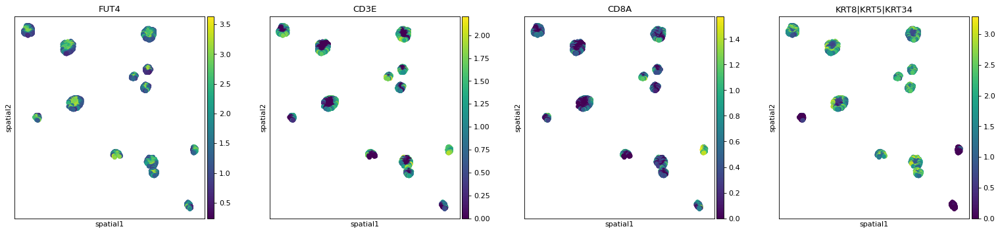

... storing 'sample' as categorical
... storing 'patient' as categorical


sample1-b


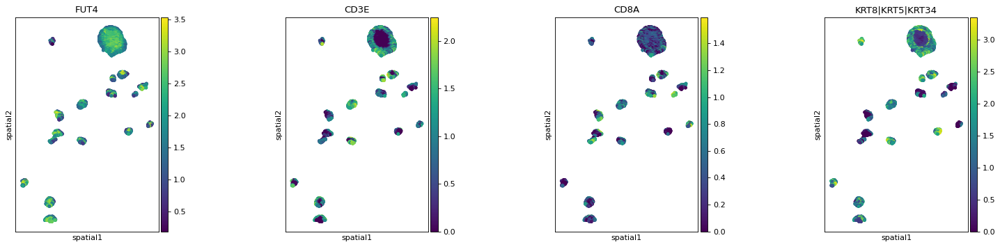

... storing 'sample' as categorical
... storing 'patient' as categorical


sample2-a


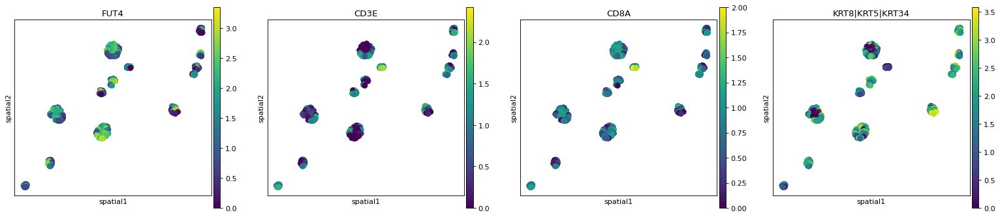

... storing 'sample' as categorical
... storing 'patient' as categorical


sample2-b


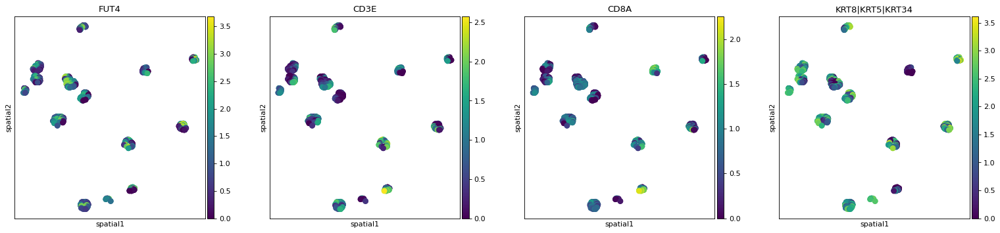

In [155]:
# Visualize each tissue sample for a subset of features
mygenes = ['FUT4', 'CD3E', 'CD8A', 'KRT8|KRT5|KRT34']

for sample in snames:
    print(sample)
    sq.pl.spatial_scatter(
        cad2[cad2.obs['sample'] == sample],
        library_id="spatial",
        shape=None,
        color=mygenes,
        #wspace=0.4,
    )
    plt.show()

... storing 'sample' as categorical
... storing 'patient' as categorical


sample1-a


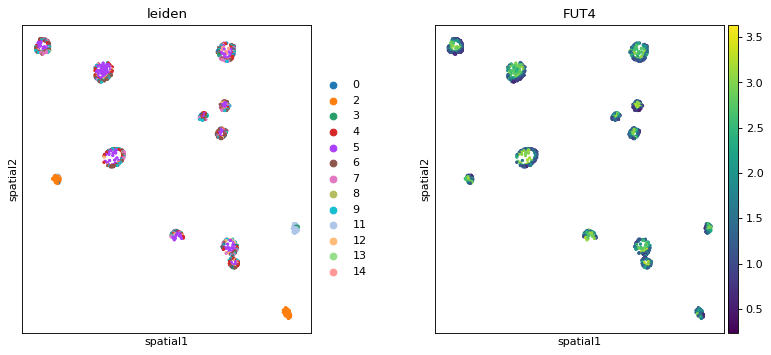

... storing 'sample' as categorical
... storing 'patient' as categorical


sample1-b


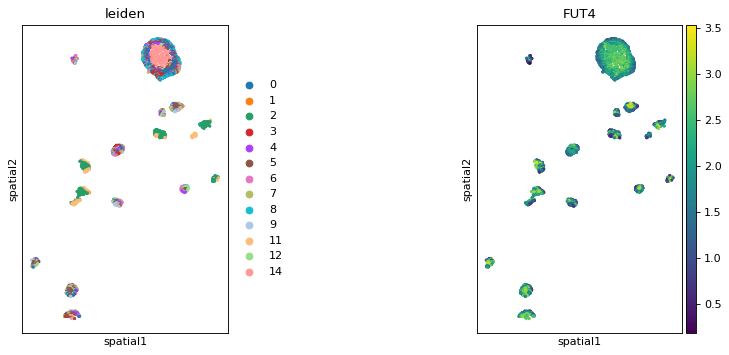

... storing 'sample' as categorical
... storing 'patient' as categorical


sample2-a


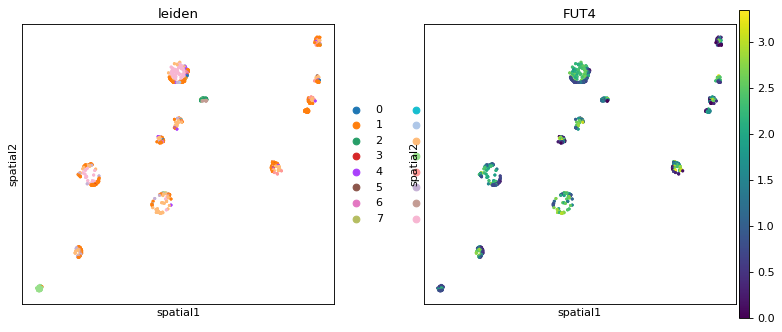

... storing 'sample' as categorical
... storing 'patient' as categorical


sample2-b


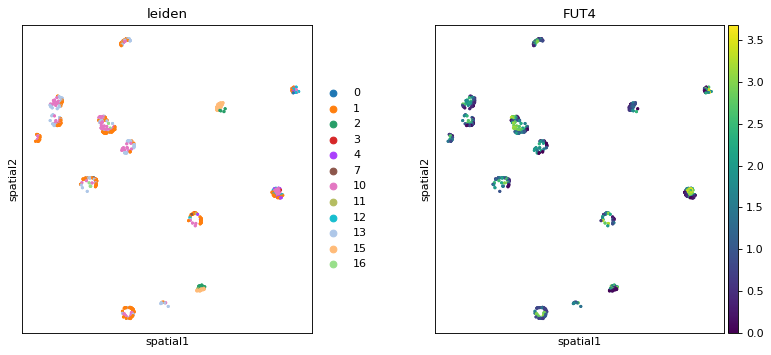

In [156]:
# Plot each sample
for sample in snames:
    print(sample)
    sq.pl.spatial_scatter(
        cad2[cad2.obs['sample'] == sample],
        library_id="spatial",
        shape=None,
        size=12,
        color=["leiden", "FUT4"])
    #plt.title(sample, size=16)
    plt.show()

... storing 'sample' as categorical
... storing 'patient' as categorical


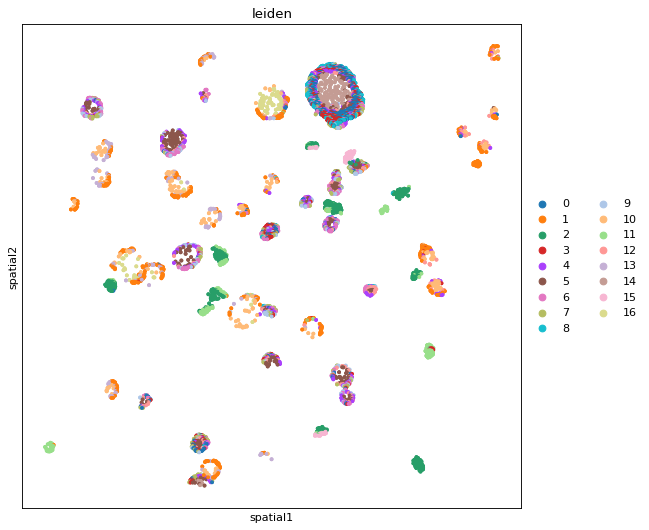

In [157]:
# Plot all samples in same space 🍩
sq.pl.spatial_scatter(
    cad2,
    library_id="spatial",
    shape=None,
    color=["leiden"],
    figsize=(8,8),
)
#plt.title(sample, size=16)
plt.show()

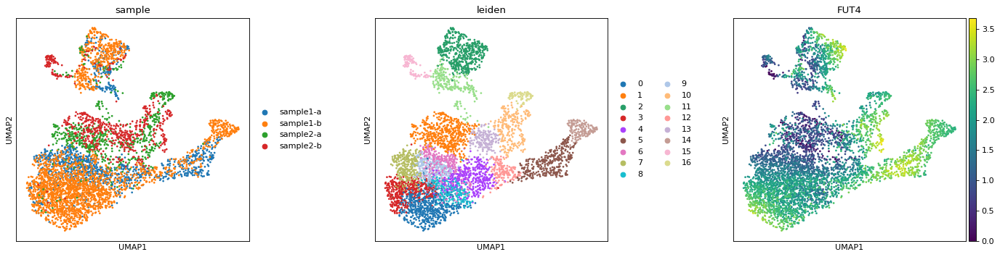

In [158]:
# visualize umap of clusters for all samples
sc.pl.umap(
    cad2,
    color=["sample", "leiden", "FUT4"], 
    wspace=0.4,
)

Sample1 and sample2 individuals are different. The 'a' and 'b' labels denote different tissue slices from an individual. The difference between the two patient samples could be real or could be a batch effect.

  0%|          | 0/1000 [00:00<?, ?/s]

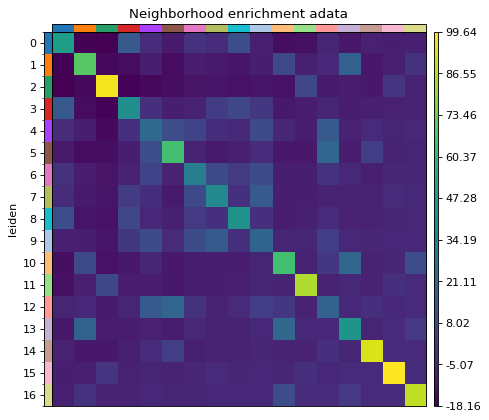

In [159]:
# Neighborhood enrichment
sq.gr.spatial_neighbors(cad2, coord_type="generic", delaunay=True)
sq.gr.nhood_enrichment(cad2, cluster_key="leiden")
sq.pl.nhood_enrichment(
    cad2,
    cluster_key="leiden",
    figsize=(5, 5),
    title="Neighborhood enrichment adata",
)

In [160]:
lclustersoi = ['2', '5', '10', '11', '14', '16']

sample1-a


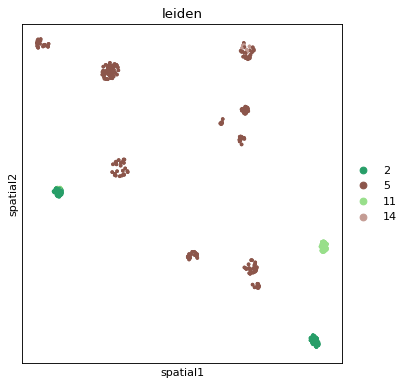

sample1-b


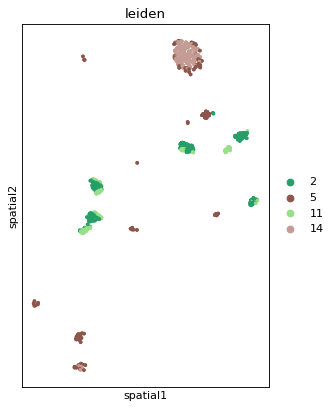

sample2-a


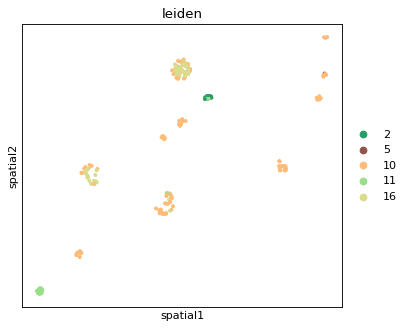

sample2-b


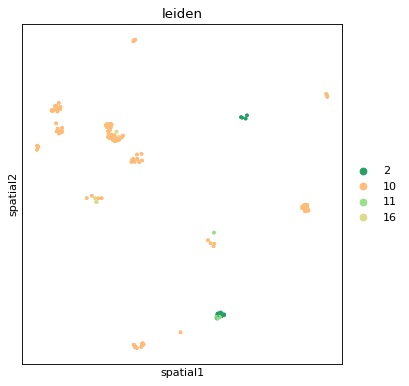

In [161]:
# Plot specific leiden clusters
for sample in snames:
    print(sample)
    sq.pl.spatial_scatter(
        cad2[(cad2.obs['leiden'].isin(lclustersoi)) & (cad2.obs['sample'] == sample)],
        library_id="spatial",
        shape=None,
        color=["leiden"],
        figsize=(5,5),
        size=20,
    )
    plt.show()

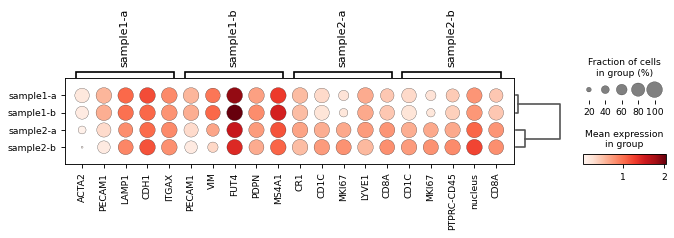

In [162]:
sc.tl.rank_genes_groups(cad2, 'sample', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups_dotplot(cad2, n_genes=5, key="wilcoxon", groupby="sample")

In [163]:
#sc.tl.rank_genes_groups(cad2, 'leiden', method='wilcoxon', key_added = "wilcoxon")
#sc.pl.rank_genes_groups_dotplot(cad2, n_genes=5, key="wilcoxon", groupby="leiden")

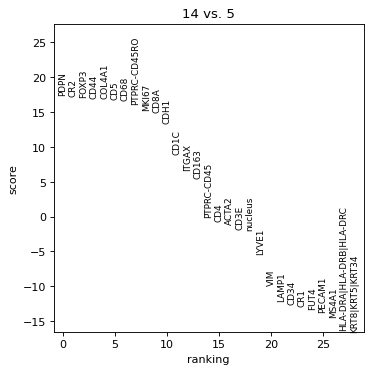

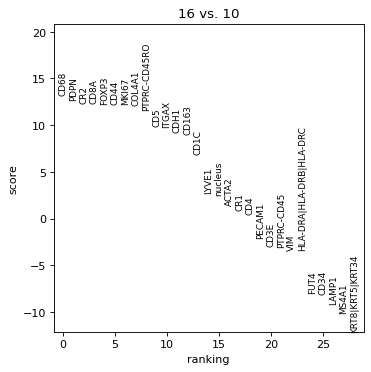

In [164]:
# Identify dfferentally expressed genes for specific clusters against a reference
csets = [['5', '14'], ['10', '16'], #['2', '11'], ['11', '14'], ['5', '11'], ['5', '2']
        ]
for pair in csets:
    sc.tl.rank_genes_groups(cad2, 'leiden', method='wilcoxon', groups=[pair[1]], reference=pair[0])
    sc.pl.rank_genes_groups(cad2, groups=[pair[1]], n_genes=29)

# [3] Pseudobulk comparisons

### [3.1] Pseduobulk comparisons: CODEX protein expression inside versus outside of cells in HCs

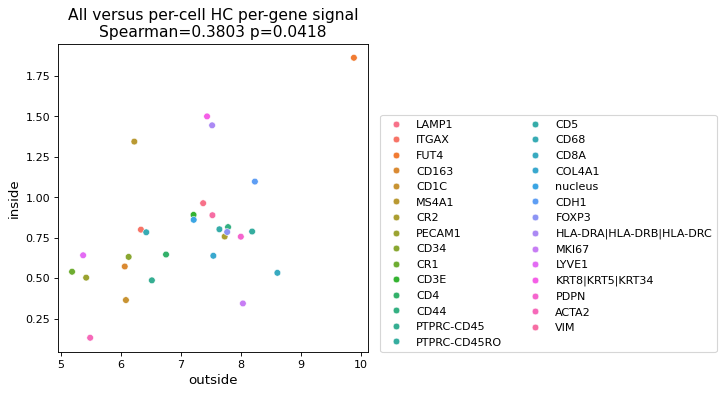

In [167]:
# Pseudobulk per-gene comparison normalized by number of ids (structures or cells)
x = cad.to_df().sum()/len(cad)
y = cad2.to_df().sum()/len(cad2)
srs,srsp = scipy.stats.spearmanr(x, y)
srs = round(srs,4)
srsp = round(srsp,4)

sns.scatterplot(
    x=x,
    y=y,
    hue=x.index
)
plt.xlabel('outside', size=12)
plt.ylabel('inside', size=12)
plt.title(f"All versus per-cell HC per-gene signal\nSpearman={srs} p={srsp}", size=14)
plt.legend(loc=(1.04,0), ncol=2)
plt.show()

We see a positive correlation with a weak rank score. MS4A1, KRTs and HLA-DRs are above the diagnal, while MKI67 and CD8A are below the diagnal. These correspond to differentially expressed in the previous section's gene rank plots of
- Inside leiden clusters 14 & 16
- Outside leiden clusters 5 & 10 

In [168]:
lclustersoi

['2', '5', '10', '11', '14', '16']

In [169]:
discrepantgenes = ['MS4A1', 'KRT8|KRT5|KRT34', 'HLA-DRA|HLA-DRB|HLA-DRC', 'MKI67', 'CD8A']

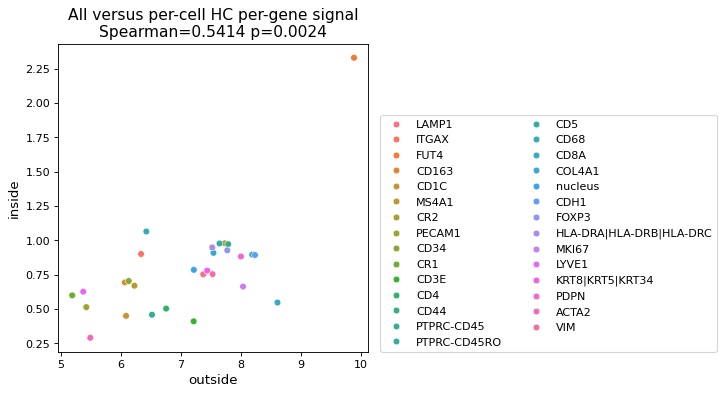

In [170]:
# Subset the correlation to the more central leiden clusters
x = cad.to_df().sum()/len(cad)
y = cad2[cad2.obs['leiden'].isin(lclustersoi)].to_df().sum()/len(cad2[cad2.obs['leiden'].isin(lclustersoi)])
srs,srsp = scipy.stats.spearmanr(x, y)
srs = round(srs,4)
srsp = round(srsp,4)

sns.scatterplot(
    x=x,
    y=y,
    hue=x.index
)
plt.xlabel('outside', size=12)
plt.ylabel('inside', size=12)
plt.title(f"All versus per-cell HC per-gene signal\nSpearman={srs} p={srsp}", size=14)
plt.legend(loc=(1.04,0), ncol=2)
plt.show()

### [3.2] Pseduobulk comparisons: CODEX versus 2D IMC thymus HCs 
HuBMAP offers thymus 2D Imaging Mass Cytometry (IMC) data as well as a 3D IMC data. Look into one of the 2D samples.

In [20]:
# Manually curated mask from QuPath and the image path
imsdir = f'{ddir}9a6403bb0423e62950926a7d4fdab45b/ometiff/20191202_HuBMAP_Thymus/'
imsimgurl = f'{imsdir}20191202_HuBMAP_Thymus_s0_p8_r6_a6_ac.ome.tiff' #non-pyramidal

# Feature map I cleaned up previously
channamesurl = f'{repofilepath}channelnames-shlee.csv'
channames = pd.read_csv(channamesurl)
channames[:2]

,metal,channel,target,name
0,ArAr80,0,80ArAr,na
1,Y89,1,HLA-ABC_19602744Y89,HLA-A|HLA-B|HLA-C


(1000, 1000) (250, 250)


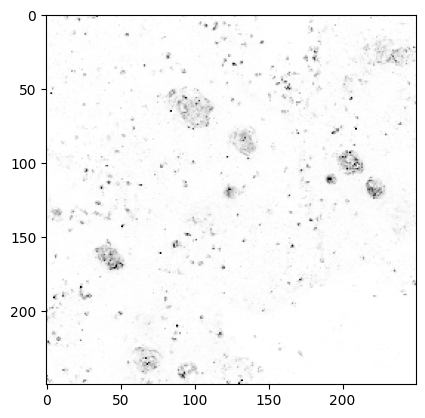

In [26]:
# Create data object for 2D IMS sample image data by binning. 
# This dataset has stains that enable nuclei and cell segmentation. There are many tutorials for the myriad cell segmentation tools out there.
# Taking simple approach of 4x4 binning the signal. Each pixel is originally 1 µm in size. 
ichans = {}
iarrays = {}
factor = 0.25

for i in range(len(channames)):

    with tifffile.TiffFile(imsimgurl) as itif:
        ipage = itif.pages[i]
        iimg = ipage.asarray()
        resample = scipy.ndimage.zoom(iimg, factor, order=1,) #grid_mode=True)    
        iimgdf = pd.DataFrame(resample)
        iarrays[i] = resample
        ichans[i] = iimgdf
        
print(iimg.shape, resample.shape)
plt.imshow(iarrays[44], cmap='binary', vmax=np.max(iarrays[44])/3)

In [173]:
# Create barcode ids
barcodes = []
spatial = []

for c in range(len(ichans[0])):
    for r in range(len(ichans[0])):
        clabel = "{:03d}".format(c)
        rlabel = "{:03d}".format(r)
        barcodes.append(f'imc-x{clabel}y{rlabel}')     
        spatial.append([c,r])

print(len(barcodes))
spatial = np.array(spatial)

62500


In [174]:
# col,row
percellarrays = []
features = []

for k,a in iarrays.items(): 
    gene = list(channames[channames['channel'] == k]['name'])[0]
                    
    if gene == 'na':
        continue
    else:
        percellarray = []
        features.append(gene)

        # Create barcode ids
        for c in range(len(ichans[0])):
            for r in range(len(ichans[0])):
                clabel = "{:03d}".format(c)
                rlabel = "{:03d}".format(r)
                label = f'imc-x{clabel}y{rlabel}'

                pv = a[c][r]
                percellarray.append(pv)
                
        percellarrays.append(np.array(percellarray))

In [175]:
# Transpose the per cell arrays into per feature arrays
perfeaturearrays = np.array(list(zip(*percellarrays)))

# Create AnnData object
idata = sc.AnnData(perfeaturearrays, obsm={"spatial": spatial})
idata.var.index = features
idata.obs['ID'] = barcodes
idata.obs.index = idata.obs['ID']
xyzip = np.array([list(t) for t in zip(*idata.obsm['spatial'])])
x = xyzip[0]
y = xyzip[1]
idata.obsm['x'] = x
idata.obsm['y'] = y

In [176]:
sc.pp.filter_cells(idata, min_counts=10)
sc.pp.filter_genes(idata, min_cells=10)
idata.layers["counts"] = idata.X.copy()
sc.pp.normalize_total(idata, inplace=True)
sc.pp.log1p(idata)
sc.pp.pca(idata)
sc.pp.neighbors(idata)
sc.tl.umap(idata)

In [177]:
# Takes some minutes
sc.tl.leiden(idata)
#idata.write(f'{ddir}idata-20241004-shlee.h5ad')

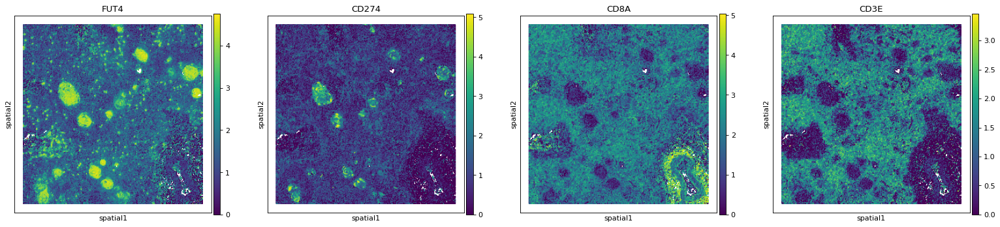

In [178]:
sq.pl.spatial_scatter(
    idata,
    library_id="spatial",
    color=[
        'FUT4', 'CD274','CD8A', 'CD3E'
    ],
    shape=None,
    size=2,
    img=False,
)

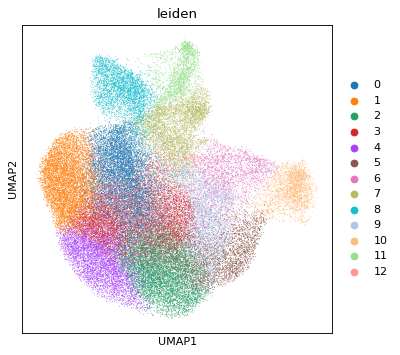

In [179]:
sc.pl.umap(
    idata,
    color=["leiden"],
)

  0%|          | 0/1000 [00:00<?, ?/s]

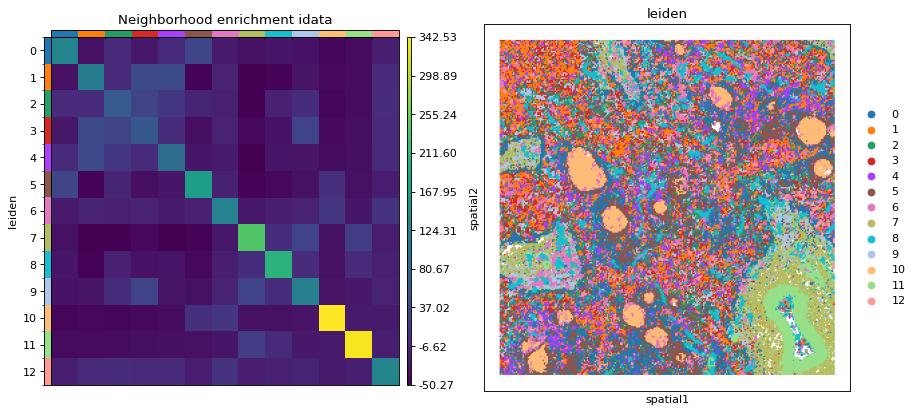

In [180]:
sq.gr.spatial_neighbors(idata, coord_type="generic", delaunay=True)
sq.gr.nhood_enrichment(idata, cluster_key="leiden")
fig, ax = plt.subplots(1, 2, figsize=(13, 7))

sq.pl.nhood_enrichment(
    idata,
    cluster_key="leiden",
    library_id="spatial",
    figsize=(8, 8),
    title="Neighborhood enrichment idata",
    ax=ax[0],
)
sq.pl.spatial_scatter(idata, color="leiden", shape=None, size=2, ax=ax[1])

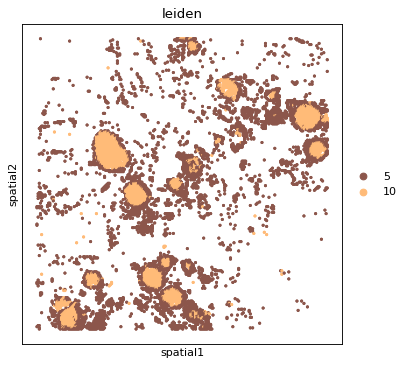

In [187]:
# Plot specific leiden clusters
iclustersoi = ['10', '5']

sq.pl.spatial_scatter(
    idata[idata.obs['leiden'].isin(iclustersoi)],
    library_id="spatial",
    shape=None,
    color=["leiden"],
    size=12,
)

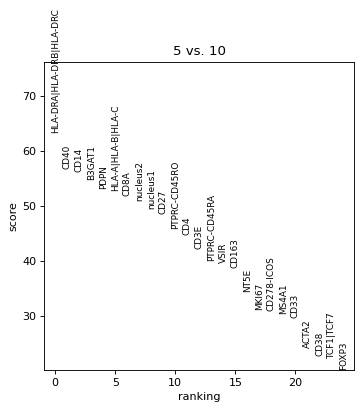

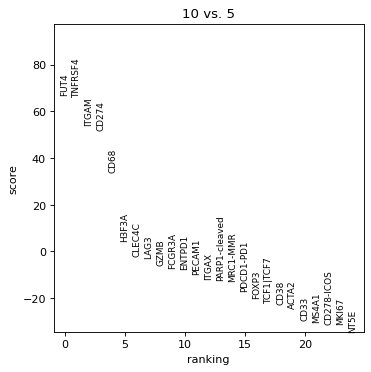

In [188]:
# Identify dfferentally expressed genes for specific clusters against a reference
csets = [iclustersoi]

for pair in csets:
    sc.tl.rank_genes_groups(idata, 'leiden', method='wilcoxon', groups=[pair[1]], reference=pair[0])
    sc.pl.rank_genes_groups(idata, groups=[pair[1]], n_genes=25)

    sc.tl.rank_genes_groups(idata, 'leiden', method='wilcoxon', groups=[pair[0]], reference=pair[1])
    sc.pl.rank_genes_groups(idata, groups=[pair[0]], n_genes=25)

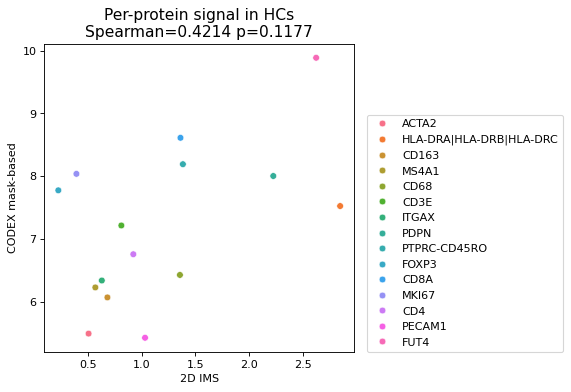

In [189]:
# Pseudobulk per-gene comparison normalized by number of ids (structures or cells)
x = idata[idata.obs['leiden'].isin(iclustersoi)].to_df().sum()/len(idata[idata.obs['leiden'].isin(iclustersoi)])
y = cad.to_df().sum()/len(cad)
ic = pd.concat([x,y], axis=1)
ic.columns = ['2D IMS', 'CODEX mask-based']
icf = ic.dropna()

srs,srsp = scipy.stats.spearmanr(icf['2D IMS'], icf['CODEX mask-based'], nan_policy='omit')
srs = round(srs,4)
srsp = round(srsp,4)

sns.scatterplot(
    x='2D IMS',
    y='CODEX mask-based',
    data=icf,
    hue=icf.index
)
plt.title(f"Per-protein signal in HCs\nSpearman={srs} p={srsp}", size=14)
plt.legend(loc=(1.04,0))
plt.show()

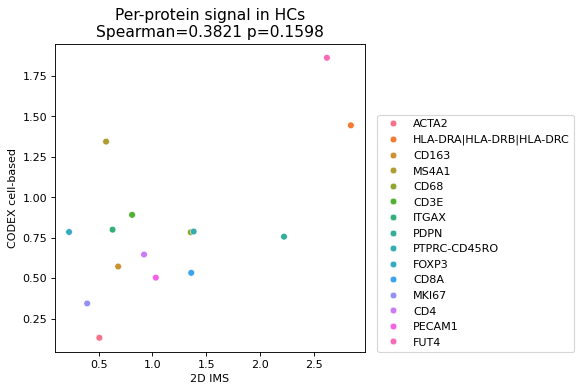

In [190]:
# Pseudobulk per-gene comparison normalized by number of ids (structures or cells)
#x = idata[idata.obs['leiden']=='11'].to_df().sum()/len(idata[idata.obs['leiden']=='11'])
x = idata[idata.obs['leiden'].isin(iclustersoi)].to_df().sum()/len(idata[idata.obs['leiden'].isin(iclustersoi)])
y = cad2.to_df().sum()/len(cad2)
ic = pd.concat([x,y], axis=1)
ic.columns = ['2D IMS', 'CODEX cell-based']
icf = ic.dropna()

srs,srsp = scipy.stats.spearmanr(icf['2D IMS'], icf['CODEX cell-based'], nan_policy='omit')
srs = round(srs,4)
srsp = round(srsp,4)

sns.scatterplot(
    x='2D IMS',
    y='CODEX cell-based',
    data=icf,
    hue=icf.index
)
plt.title(f"Per-protein signal in HCs\nSpearman={srs} p={srsp}", size=14)
plt.legend(loc=(1.04,0))
plt.show()

The masked-based CODEX HC data corresponds slightly better to the 2D IHC data compared to the cell-based CODEX data for the 15 common markers. Keep in mind the patient sample is different for the 2D IHC sample than the CODEX samples.

### [3.3] Pseudobulk comparisons: CODEX, 2D IMC and scRNA-Seq
CZI cellxgene hosts single-cell RNA-Seq cell atlas data for human thymus. The study
> [A cell atlas of human thymic development defines T cell repertoire formation](https://www.science.org/doi/10.1126/science.aay3224)

offers three data sets.

In [13]:
cziurls = {
    'czifull': 'c6e08ab6-ab3b-41dc-8058-8e6442e081ec.h5ad', # 255,901 cells
    'czistem': '59d5b3c5-9a55-44ae-a7fa-c14567e02755.h5ad', # 27,589 cells
    'czitecs': '5401b83e-2c9b-40a0-b20e-fd9a58c69d92.h5ad', # 18,524 cells
}
cgdir = f'{ddir}cellxgene/'
ctlabel = 'cell_type'

In [192]:
for url in cziurls.values():
    !wget --directory-prefix={cgdir} https://datasets.cellxgene.cziscience.com/{url}

--2024-11-13 01:14:59--  https://datasets.cellxgene.cziscience.com/c6e08ab6-ab3b-41dc-8058-8e6442e081ec.h5ad
Resolving datasets.cellxgene.cziscience.com (datasets.cellxgene.cziscience.com)... 13.32.151.100, 13.32.151.10, 13.32.151.108, ...
Connecting to datasets.cellxgene.cziscience.com (datasets.cellxgene.cziscience.com)|13.32.151.100|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2633195386 (2.5G) [binary/octet-stream]
Saving to: ‘datasets/cellxgene/c6e08ab6-ab3b-41dc-8058-8e6442e081ec.h5ad.1’

c6e08ab6-ab3b-41dc- 100%[===================>]   2.45G  6.07MB/s    in 3m 56s  

2024-11-13 01:18:55 (10.6 MB/s) - ‘datasets/cellxgene/c6e08ab6-ab3b-41dc-8058-8e6442e081ec.h5ad.1’ saved [2633195386/2633195386]

--2024-11-13 01:18:56--  https://datasets.cellxgene.cziscience.com/59d5b3c5-9a55-44ae-a7fa-c14567e02755.h5ad
Resolving datasets.cellxgene.cziscience.com (datasets.cellxgene.cziscience.com)... 13.32.151.37, 13.32.151.108, 13.32.151.100, ...
Connecting to datase

In [22]:
def anndataToPseudobulk(
    url = str,
    slabel = None,
    flabel = 'feature_name',
    clabel = 'cell_type',
):
    adata = ad.read_h5ad(url)
    adata.var.index = adata.var[flabel]
    cts = set(adata.obs[clabel])
    bulk = []
    for ct in cts:
        sub = adata[adata.obs[adata.obs[clabel] == ct].index].to_df()
        sub2 = pd.DataFrame(sub.sum()/len(sub))
        sub2.columns = [ct]
        bulk.append(sub2)

    return bulk

In [102]:
#czibulkraw = {}
#czibulkraw['czitecs'] = ad.read_h5ad('datasets/cellxgene/5401b83e-2c9b-40a0-b20e-fd9a58c69d92.h5ad')
#czibulkraw['czistem'] = ad.read_h5ad('datasets/cellxgene/59d5b3c5-9a55-44ae-a7fa-c14567e02755.h5ad')
#czibulkraw['czifull'] = ad.read_h5ad('datasets/cellxgene/c6e08ab6-ab3b-41dc-8058-8e6442e081ec.h5ad')

#czibulk = {}
#czibulk['czitecs'] = anndataToPseudobulk(czibulkraw['czitecs'])
#czibulk['czistem'] = anndataToPseudobulk(czibulkraw['czistem'])
#czibulk['czifull'] = anndataToPseudobulk(czibulkraw['czifull'])

In [23]:
cziurls = {
    'czifull': 'c6e08ab6-ab3b-41dc-8058-8e6442e081ec.h5ad',
    'czistem': '59d5b3c5-9a55-44ae-a7fa-c14567e02755.h5ad',
    'czitecs': '5401b83e-2c9b-40a0-b20e-fd9a58c69d92.h5ad'}

# Read in AnnData objects and convert to pseudobulk counts for each cell_type label
czibulk = {}

# This works on my laptop but in HuBMAP Workspaces gives an 'unable to sychronously' error.
# Reading in individually kills the kernel. I think these may be too unweildy. More cores and more memory seem to help.
for name,url in cziurls.items():
    print(f'{ddir}cellxgene/{url}')
    pseudo = anndataToPseudobulk(f'{ddir}cellxgene/{url}')
    czibulk[name] = pseudo

datasets/cellxgene/c6e08ab6-ab3b-41dc-8058-8e6442e081ec.h5ad
datasets/cellxgene/59d5b3c5-9a55-44ae-a7fa-c14567e02755.h5ad
datasets/cellxgene/5401b83e-2c9b-40a0-b20e-fd9a58c69d92.h5ad


In [30]:
# Wrangle gene names from the CODEX and IMC data and find common genes to CZI
onames = set()
nameslist = list(channames['name']) + list(codexgenemap['codex'])

for cname in nameslist:
    if cname == 'na':
        continue
    elif str('|') in str(cname):
        mnames = cname.split('|')
        for mname in mnames:
            onames.add(mname)
    elif str('-') in str(cname):
        mnames = cname.split('-')
        for mname in mnames:
            onames.add(mname)
    else:
        onames.add(cname)

commongenes = list(set(list(czibulk['czitecs'][0].index)).intersection(onames))
len(commongenes)

53

In [31]:
cad = ad.read_h5ad('cad.h5ad')
cad2 = ad.read_h5ad('cad2.h5ad')
idata = ad.read_h5ad('idata.h5ad')

In [32]:
lclustersoi = ['2', '5', '10', '11', '14', '16']
iclustersoi = ['9', '6']

In [33]:
x = cad.to_df().sum()/len(cad)
y = cad2[cad2.obs['leiden'].isin(lclustersoi)].to_df().sum()/len(cad2[cad2.obs['leiden'].isin(lclustersoi)])
z = idata[idata.obs['leiden'].isin(iclustersoi)].to_df().sum()/len(idata[idata.obs['leiden'].isin(iclustersoi)])

xyz = pd.DataFrame(pd.concat([x,y,z], axis=1))
xyz.columns = ['CODEX mask-based', 'CODEX cell-based', '2D IMC']

In [39]:
pd.concat(czibulk['czifull'], axis=1)

,group 3 innate lymphoid cell,"CD8-positive, alpha-beta memory T cell",regulatory T cell,natural killer cell,erythrocyte,fibroblast,"CD4-positive, alpha-beta T cell",medullary thymic epithelial cell,macrophage,dendritic cell,...,monocyte,"CD4-positive, alpha-beta memory T cell",gamma-delta T cell,vascular associated smooth muscle cell,T cell,megakaryocyte,lymphocyte,mast cell,memory B cell,plasma cell
feature_name,,,,,,,,,,,,,,,,,,,,,
TSPAN6,0.044675,0.007726,0.046023,0.021578,0.214231,0.719379,0.103002,0.869268,0.035429,0.069640,...,0.000000,0.036054,0.160399,0.245285,0.126593,0.068744,1.045210,0.185827,0.001329,0.039228
TNMD,0.000000,0.000000,0.000000,0.001432,0.006956,0.045375,0.000000,0.008097,0.000000,0.000000,...,0.000000,0.000000,0.000775,0.268392,0.000000,0.000000,0.027963,0.000000,0.000000,0.000000
DPM1,0.781460,0.405913,0.463243,0.514863,1.000435,0.613272,0.496960,0.535895,0.503311,0.769474,...,0.523218,0.492566,1.153532,0.378003,0.522089,1.813107,0.526063,0.869463,0.298341,0.291107
SCYL3,0.237427,0.105437,0.163055,0.162699,0.122967,0.110275,0.185980,0.123444,0.087109,0.110124,...,0.048003,0.152191,0.186045,0.063967,0.163141,0.076717,0.089679,0.084497,0.116879,0.059619
C1orf112,0.106015,0.036594,0.156527,0.086081,0.294090,0.079711,0.101125,0.079478,0.174566,0.151801,...,0.041251,0.052511,0.292021,0.041999,0.108504,0.290621,0.104367,0.060474,0.044260,0.011846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000283096.1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ENSG00000283103.5,0.460446,0.267978,0.272111,0.416208,0.613991,0.384515,0.355292,0.425892,0.266957,0.272247,...,0.265153,0.269302,0.876663,0.390089,0.393715,0.607764,0.398728,0.590622,0.186203,0.298688
MGC4859,0.000000,0.000000,0.000957,0.000000,0.000000,0.001824,0.001214,0.009011,0.000000,0.002347,...,0.000000,0.004307,0.002645,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.012399


In [40]:
commondfs = {}

for name,mylist in czibulk.items():
    df = pd.concat(mylist, axis=1)
    czisub = df.loc[commongenes]
    czisub = czisub.merge(xyz, how='outer', left_index=True, right_index=True)

    commondfs[name] = czisub

print(commondfs.keys())

dict_keys(['czifull', 'czistem', 'czitecs'])


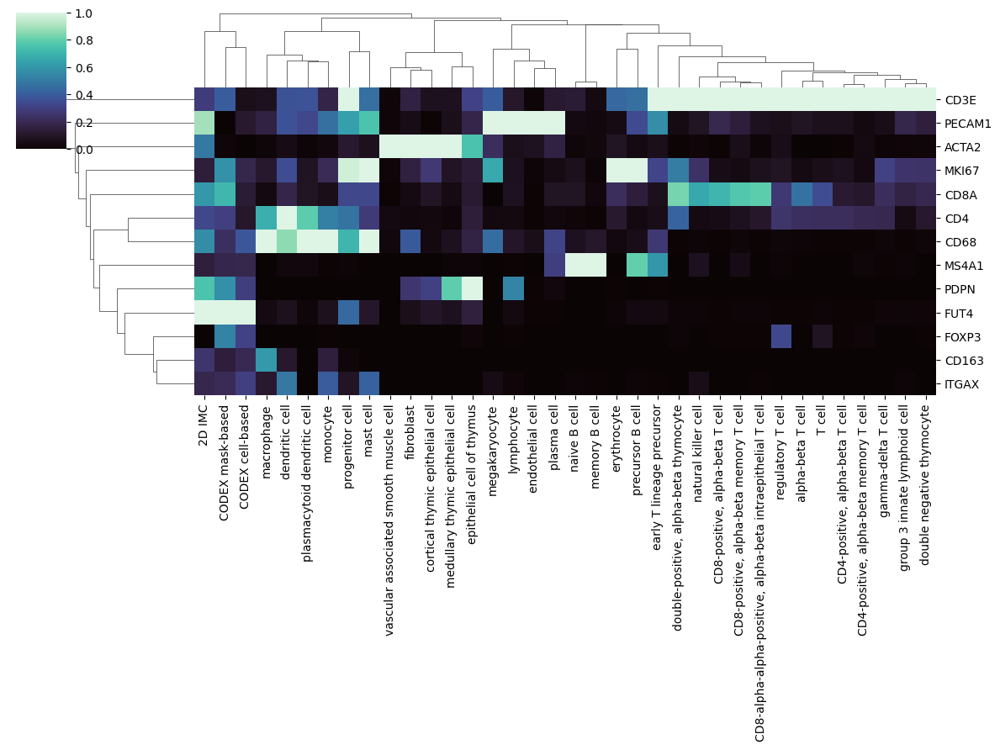

In [44]:
sns.clustermap(
    commondfs['czifull'].dropna(), 
    standard_scale=1, 
    cmap='mako',
    figsize=(12,9),
    row_cluster=True,
    col_cluster=True,
)

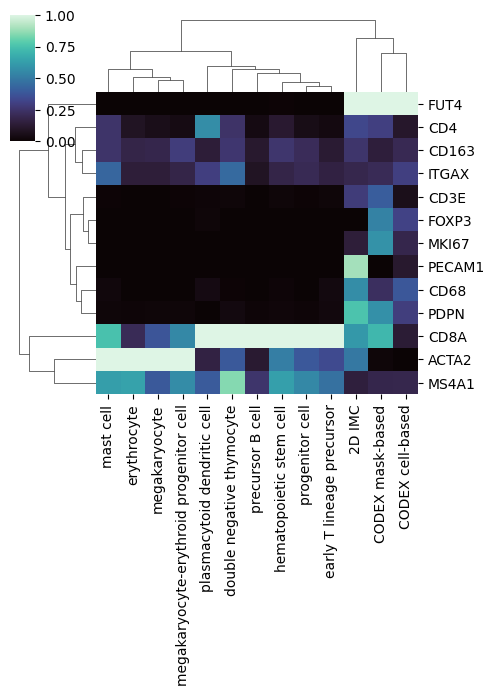

In [45]:
sns.clustermap(
    commondfs['czistem'].dropna(), 
    standard_scale=1, 
    cmap='mako',
    figsize=(5,7),
    row_cluster=True,
    col_cluster=True,
)

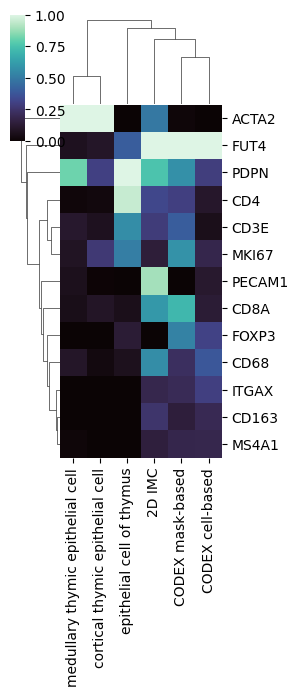

In [46]:
sns.clustermap(
    commondfs['czitecs'].dropna(), 
    standard_scale=1, 
    cmap='mako',
    figsize=(3,7),
    row_cluster=True,
    col_cluster=True,
)

Literature states HC cells are akin to medullary TECs. RNA expression does not always correlate with protein expression and technology differences can make data noncomparable. 